In [33]:
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import trimesh

outputs = [
    '036bc96c-419d-4a43-812e-1e533d95dfd3/0014',        #0
    '5d71dabb-9464-4e0c-8d98-e829ade827af/rgb_0034',    #1
    '378deb84-a0d6-4aab-93f5-ea9d4223b030/rgb_0002',    #2
    '62186c4a-b522-4729-99bd-0c88e54dbf83/rgb_0029',    #3 Couch and table in front | good
    'b01b75da-3dad-4961-863a-3834d6479711/rgb_0042',    #4 Bed with overlapping cabinets | bad - panoptic has disconnected artifacts
    'f95acb63-fe70-447f-a493-75b0c6174f59/rgb_0060',    #5 Bed with cabinet | good
    'af3a0928-2e39-4864-9f53-d17205cba116/rgb_0059',    #6 Bed + chair + table | bad - with disconnected artifacts
    'e16c4c32-c989-4e79-bb03-627edc763e44/rgb_0047',    #7 Bed + other | ok - bed good but other not so good
    'c7818ac9-9bfe-40c5-932a-32d4c83ceab0/rgb_0001',    #8 Chairs + table | ok - lots of artifacts
    '8422cae1-c835-4703-aa9d-b15c8824bbc3/rgb_0011',    #9 CHairs + table | very bad - table not found in instance
    
    '7cb44194-7156-4c8f-94dc-3c0322833ef1/rgb_0010',    #10 Couch with table
    'dc967ffc-d83c-4b5d-aaf9-1d86a133928f/rgb_0013',     #11 Cabinet only
    'b7516366-5a72-4206-afa3-98e1f87ae3d1/rgb_0024',     #12 Table + two chairs + cabined#
    'b7516366-5a72-4206-afa3-98e1f87ae3d1/rgb_0012',     #13 Couch + chair + table in front
    'e836a041-71fd-4fd4-9aa5-84cbc37b69dd/rgb_0004',     #14 Desk, chair
    
    'a8c505d9-160b-4a66-9358-5c0bb4d90562/rgb_0051',     #15
    '7f1c14eb-0479-4bd8-a52d-7952ad51a1f0/rgb_0049',     #16
    '5e9d0b19-17ef-47e5-8d53-eb0bba6d62b6/rgb_0016',    #17
    # New:
    "d4d0237f-a66b-40cf-bf85-56e11cb20602/rgb_0005",    #18
    "d4d0237f-a66b-40cf-bf85-56e11cb20602/rgb_0112",    #19
    "d4d0237f-a66b-40cf-bf85-56e11cb20602/rgb_0058",    #20
    "d4d0237f-a66b-40cf-bf85-56e11cb20602/rgb_0203",    #21
    "d4d0237f-a66b-40cf-bf85-56e11cb20602/rgb_0245",    #22
    "d8442781-1fb7-4d74-a3ef-c7bea7299bb3/rgb_0019",    #23
    "d8442781-1fb7-4d74-a3ef-c7bea7299bb3/rgb_0008",    #24
    "d8442781-1fb7-4d74-a3ef-c7bea7299bb3/rgb_0000",    #25
    "f1c69ce3-d538-41a1-8542-fb78f90316c1/rgb_0017",    #26
    "f1c69ce3-d538-41a1-8542-fb78f90316c1/rgb_0019",    #27
    "4c2c82a1-1589-4326-be92-03187ba0b459/rgb_0010",    #28
    "4c2c82a1-1589-4326-be92-03187ba0b459/rgb_0017",    #29
    "4c2c82a1-1589-4326-be92-03187ba0b459/rgb_0014",    #30
    "e82a25d9-aac5-489a-b6c3-8830dda1d0e8/rgb_0016",    #31
    "e82a25d9-aac5-489a-b6c3-8830dda1d0e8/rgb_0013",    #32
    "e82a25d9-aac5-489a-b6c3-8830dda1d0e8/rgb_0009",    #33
    "53cf7da8-7c02-419d-bc4a-acf5d4337cac/rgb_0014",    #34
]


model = 'df_steps-6000' #"sdfusion-mm2shape", "df_steps-6000", "df_steps-12000"
#model = 'sdfusion-mm2shape' #"sdfusion-mm2shape", "df_steps-6000", "df_steps-12000"
number = 29

OUTPUT_PATH = f'outputs/{model}/{outputs[number]}/'

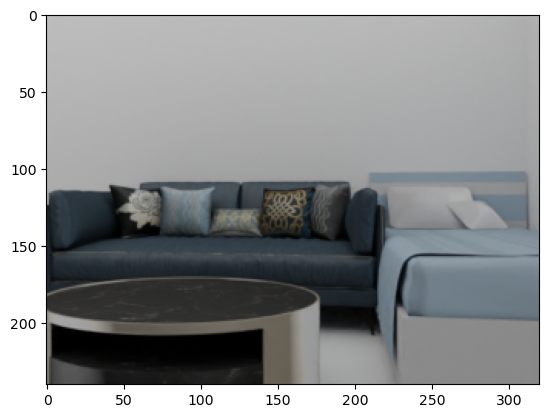

In [34]:
img = mpimg.imread(f"{OUTPUT_PATH}image.png")

plt.imshow(img)
plt.show()

In [35]:
mesh_path= OUTPUT_PATH + 'mesh_instances.ply'
mesh = trimesh.load(mesh_path)
trimesh.repair.fix_inversion(mesh)
mesh.apply_transform([  
                        [ 1.0000,  0.0000,  0.0000, 0.0000],
                        [ 0.0000,  -1.0000,  0.0000, 0.0000],
                        [ 0.0000,  0.0000,  -1.0000, 0.0000],
                        [ 0.0000,  0.0000,  0.0000, 1.0000]
                    ])
mesh.show()

In [36]:
import trimesh

mesh_path= OUTPUT_PATH + 'mesh_joined_instances.ply'
mesh = trimesh.load(mesh_path)
mesh.show()

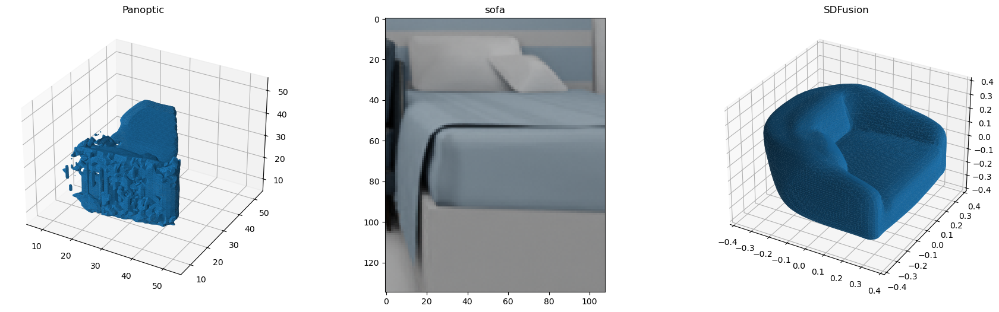

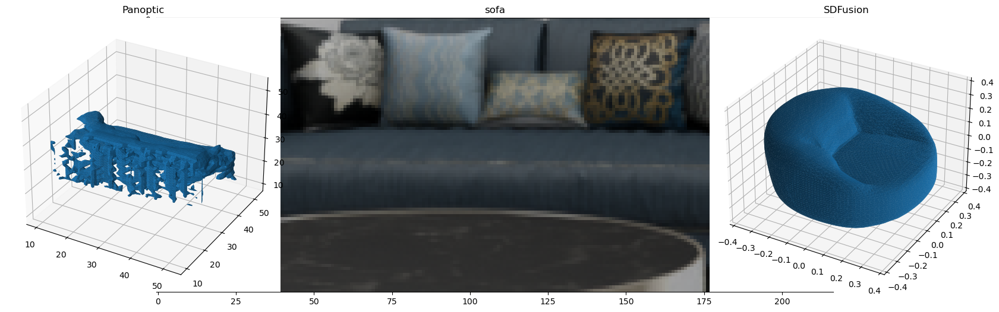

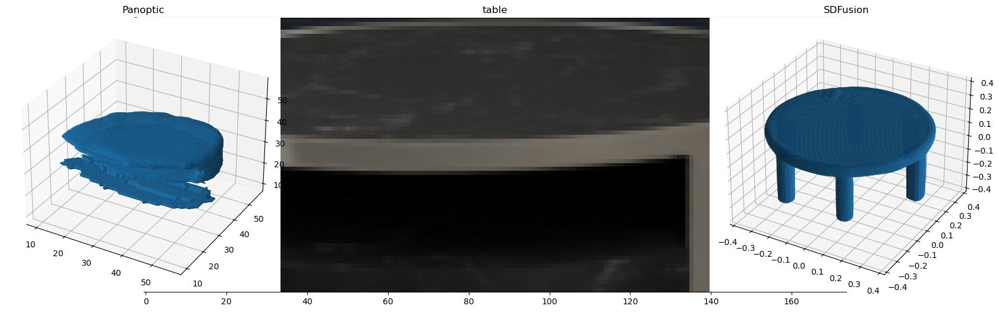

In [37]:
def set_axis_limit(subblot, min_val, max_val):
    subblot.set_xlim([min_val, max_val])
    subblot.set_ylim([min_val, max_val])
    subblot.set_zlim([min_val, max_val])

with open(f'{OUTPUT_PATH}/semantic_labels.json') as f:
    instance_json = json.load(f)

    for instance_id in instance_json:
        # Load your meshes
        panoptic_mesh = trimesh.load(f'{OUTPUT_PATH}mesh_sdf_{instance_id}.obj')
        sdfusion_mesh = trimesh.load(f'{OUTPUT_PATH}mesh_sdfusion_{instance_id}.obj')    

        # Create a figure with 2 subplots side by side
        fig = plt.figure(figsize=(28, 6))

        img = mpimg.imread(f"{OUTPUT_PATH}mask_{instance_id}.png")
        #Add subplot for the first mesh
        ax_img = fig.add_subplot(111)
        ax_img.set_title(f'{instance_json[instance_id]}')
        #Plot the first mesh
        ax_img.imshow(img)

        # Add subplot for the first mesh
        ax_panoptic = fig.add_subplot(121, projection='3d')
        ax_panoptic.set_title(f'Panoptic')
        # Plot the first mesh
        set_axis_limit(ax_panoptic, panoptic_mesh.vertices.min(), panoptic_mesh.vertices.max())
        ax_panoptic.plot_trisurf(panoptic_mesh.vertices[:, 0], panoptic_mesh.vertices[:, 2], triangles=panoptic_mesh.faces, Z=panoptic_mesh.vertices[:, 1])
        
        

        # Add subplot for the second mesh
        ax_sdfusion = fig.add_subplot(122, projection='3d')
        ax_sdfusion.set_title(f'SDFusion')
        # Plot the second mesh
        set_axis_limit(ax_sdfusion, sdfusion_mesh.vertices.min(), sdfusion_mesh.vertices.max())
        ax_sdfusion.plot_trisurf(sdfusion_mesh.vertices[:, 0], sdfusion_mesh.vertices[:, 2], triangles=sdfusion_mesh.faces, Z=sdfusion_mesh.vertices[:, 1])

        # Show the plots
        plt.show()

In [38]:
import trimesh

mesh_path= OUTPUT_PATH + f'mesh_sdf_5.obj'
mesh = trimesh.load(mesh_path)
trimesh.repair.fix_inversion(mesh)
mesh.show()

In [39]:
import trimesh

mesh_path= OUTPUT_PATH + f'mesh_sdfusion_3.obj'
mesh = trimesh.load(mesh_path)
mesh.show()